In [86]:
import folium
!pip install exifread pillow folium

Looking in indexes: https://mirrors.aliyun.com/pypi/simple/


In [87]:
import exifread

In [88]:
from PIL import Image
im = Image.open('cq.jpg')

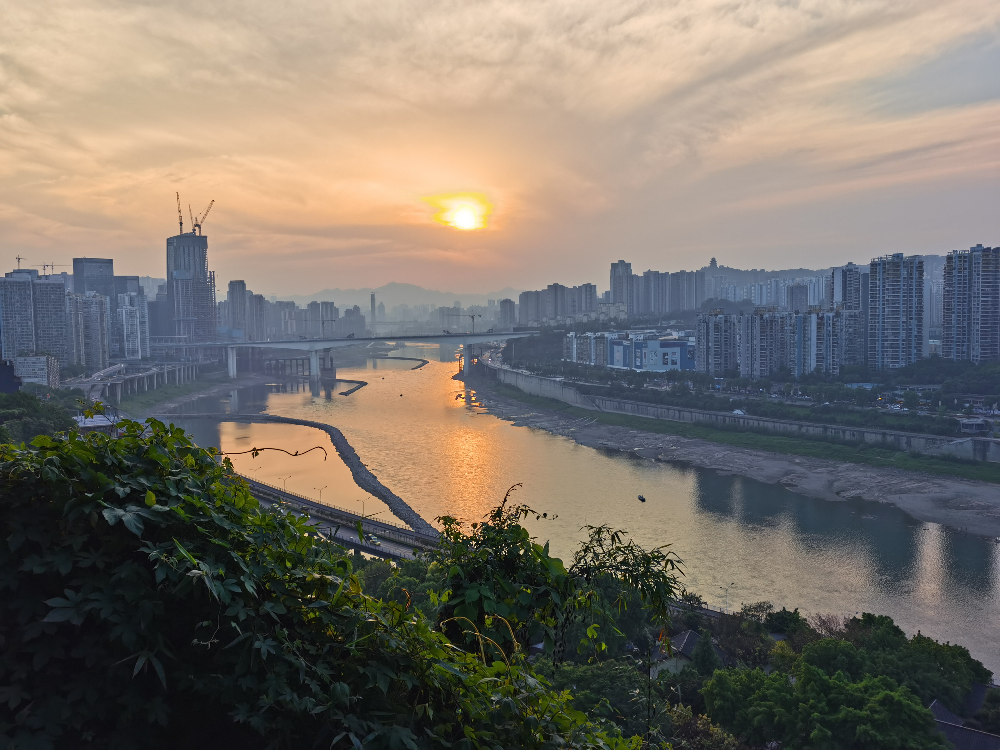

In [89]:
im

In [90]:
f = open('cq.jpg', 'rb')

In [91]:
tags = exifread.process_file(f)

In [92]:
tags

{'Image ImageWidth': (0x0100) Short=3648 @ 18,
 'Image ImageLength': (0x0101) Short=2736 @ 30,
 'Image BitsPerSample': (0x0102) Short=[8, 8, 8] @ 262,
 'Image Make': (0x010F) ASCII=HUAWEI @ 194,
 'Image Model': (0x0110) ASCII=LIO-AL00 @ 202,
 'Image Orientation': (0x0112) Short=0 @ 78,
 'Image XResolution': (0x011A) Ratio=72 @ 212,
 'Image YResolution': (0x011B) Ratio=72 @ 220,
 'Image ResolutionUnit': (0x0128) Short=Pixels/Inch @ 114,
 'Image Software': (0x0131) ASCII=LIO-AL00 10.0.0.205(C00E202R5P3) @ 228,
 'Image DateTime': (0x0132) ASCII=2020:05:01 18:59:49 @ 268,
 'Image YCbCrPositioning': (0x0213) Short=Centered @ 150,
 'Image ExifOffset': (0x8769) Long=288 @ 162,
 'GPS GPSVersionID': (0x0000) Byte=[2, 2, 0, 0] @ 1264,
 'GPS GPSLatitudeRef': (0x0001) ASCII=N @ 1276,
 'GPS GPSLatitude': (0x0002) Ratio=[29, 33, 7356033/500000] @ 1404,
 'GPS GPSLongitudeRef': (0x0003) ASCII=E @ 1300,
 'GPS GPSLongitude': (0x0004) Ratio=[106, 31, 14347229/250000] @ 1380,
 'GPS GPSAltitudeRef': (0x000

In [93]:
tags['GPS GPSLatitudeRef']

(0x0001) ASCII=N @ 1276

In [94]:
tags['GPS GPSLatitudeRef'].printable

'N'

In [95]:
tags['GPS GPSLatitude']

(0x0002) Ratio=[29, 33, 7356033/500000] @ 1404

In [96]:
tags['GPS GPSLatitude'].printable

'[29, 33, 7356033/500000]'

In [97]:
# 将经纬度处理为度分秒的表示
Latitude_list = tags['GPS GPSLatitude'].printable[1:-1].replace(', ',',').split(',')
Latitude_list_new = [eval(each) for each in Latitude_list]
#Latitude = eval(Latitude_list[0]) + eval(Latitude_list[1])/60 + eval(Latitude_list[2])/3600

Longitude_list = tags['GPS GPSLongitude'].printable[1:-1].replace(', ',',').split(',')
Longitude_list_new = [eval(each) for each in Longitude_list]
#Longitude = eval(Longitude_list[0]) + eval(Longitude_list[1])/60 + eval(Longitude_list[2])/3600

Latitude = str(Latitude_list_new[0])+'度' + str(Latitude_list_new[1])+'分'+ str(Latitude_list_new[2]) + '秒'
if tags['GPS GPSLatitudeRef'].printable !='N' :
    Latitude = ' -' + Latitude

Longitude = str(Longitude_list_new[0])+'度' + str(Longitude_list_new[1])+'分'+ str(Longitude_list_new[2]) + '秒'
if tags['GPS GPSLongitudeRef'].printable !='E' :
    Longitude = ' -' + Longitude

GPS = Latitude + ',' + Longitude
print(GPS)

29度33分14.712066秒,106度31分57.388916秒


In [98]:
# 将经纬度处理为小数表示
Latitude_list = tags['GPS GPSLatitude'].printable[1:-1].replace(', ',',').split(',')
Latitude = eval(Latitude_list[0]) + eval(Latitude_list[1])/60 + eval(Latitude_list[2])/3600

Longitude_list = tags['GPS GPSLongitude'].printable[1:-1].replace(', ',',').split(',')
Longitude = eval(Longitude_list[0]) + eval(Longitude_list[1])/60 + eval(Longitude_list[2])/3600

print(str(Latitude) + ',' + str(Longitude))

29.554086685,106.53260803222223


In [99]:
#代码汇总
import exifread

f = open('cq.jpg', 'rb')
tags = exifread.process_file(f)

Latitude_list = tags['GPS GPSLatitude'].printable[1:-1].replace(', ',',').split(',')
Latitude = eval(Latitude_list[0]) + eval(Latitude_list[1])/60 + eval(Latitude_list[2])/3600
Longitude_list = tags['GPS GPSLongitude'].printable[1:-1].replace(', ',',').split(',')
Longitude = eval(Longitude_list[0]) + eval(Longitude_list[1])/60 + eval(Longitude_list[2])/3600
print('纬度，经度：')
print(str(Latitude) + ',' + str(Longitude))

#打印照片其中一些信息
print('拍摄时间:', tags['EXIF DateTimeOriginal'])
print('照相机制造商：', tags['Image Make'])
print('照相机型号：', tags['Image Model'])
print('照片尺寸：', tags['EXIF ExifImageWidth'], tags['EXIF ExifImageLength'])

纬度，经度：
29.554086685,106.53260803222223
拍摄时间: 2020:05:01 18:59:49
照相机制造商： HUAWEI
照相机型号： LIO-AL00
照片尺寸： 3648 2736


In [100]:
# ?是查看这个库的操作手册
# ??是查看源代码
folium.Icon?

In [101]:
#打点经纬度
location_center = [29.554086685,106.53260803222223]
location_center_temp = [29.554086685,106.53260803222223]

m_1 = folium.Map(location=location_center_temp,
                 tiles='openstreetmap',
                 zoom_start=15,
                 attr='同济大学张子豪',
                 control_scale=True)

# 增加拾取经纬度控件
m_1.add_child(folium.LatLngPopup())

# 在地图上画标记
folium.Marker(
    location=location_center,
    popup='拍照点',
    icon=folium.Icon(color='blue',icon='fa-camera',prefix='fa') # 标记logo，可以从 https://fontawesome.com/ 中跳选
).add_to(m_1)

# 在地图上添加另一个标记
# folium.Marker(
#     location=[31.27861,121.36038],
#     popup='上海地铁十一号线',
#     icon=folium.Icon(color='green',icon='fa-train',prefix='fa')
# ).add_to(m_1)

# 将地图导出为html文件
m_1.save('00-重庆.html')

# 展示地图
m_1
